In [98]:
import os
from pathlib import Path

import math
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from time import time 

from skimage.measure import label, regionprops, regionprops_table

from collections import defaultdict

import pickle

import json

## load in fire events

In [7]:
with open('/home/capstone22/WildFIrePrediction/PwC-LSTM-Capstone-Project/data_analysis/image_analysis/fire_events.pkl', 'rb') as handle:
    fire_events_all = pickle.load(handle)

In [74]:
with open('/home/capstone22/WildFIrePrediction/PwC-LSTM-Capstone-Project/data_analysis/image_analysis/fire_events_byid.pkl', 'rb') as handle:
    fire_events_id = pickle.load(handle)

In [87]:
fire_events_id[0]['year']

917016    2003
917956    2003
917957    2003
917958    2003
918889    2003
          ... 
934888    2003
934889    2003
934890    2003
934891    2003
934892    2003
Name: year, Length: 290, dtype: int64

In [9]:
features = fire_events_all[2003][0].columns

In [76]:
NUM_EVENTS = len(fire_events_id)

## load in all csvs 

In [21]:
data_dir = Path('/home/capstone22/WildFIrePrediction/isaac_data/Isaac_data_original')
data_files = list(data_dir.iterdir())

IMAGE_HEIGHT, IMAGE_WIDTH = 1209, 941

In [22]:
def get_data(year, data_files):
    feature_file = None
    target_file = None
    for f in data_files:
        f_str = f.as_posix()
        if(('CD' in f_str) and (str(year) in f_str)):
            feature_file = f
        if(('TD' in f_str) and (str(year) in f_str)):
            target_file = f

    return feature_file, target_file        

def load_data(years, data_files):
    dfs = []
    for year in years:
        feature_file, target_file = get_data(year=year, data_files=data_files)
        print(year, feature_file, target_file)
        X = pd.read_csv(feature_file)
        y = pd.read_csv(target_file)
        dfs.append(X.merge(y, how='inner'))
    
    return pd.concat(dfs)

In [23]:
all_df = dict()

for year in np.arange(2003, 2018):
    df = load_data([year], data_files)
    all_df[year] = df

2003 /home/capstone22/WildFIrePrediction/isaac_data/Isaac_data_original/CD_2003_2003.csv /home/capstone22/WildFIrePrediction/isaac_data/Isaac_data_original/TD_2003_2003.csv
2004 /home/capstone22/WildFIrePrediction/isaac_data/Isaac_data_original/CD_2004_2004.csv /home/capstone22/WildFIrePrediction/isaac_data/Isaac_data_original/TD_2004_2004.csv
2005 /home/capstone22/WildFIrePrediction/isaac_data/Isaac_data_original/CD_2005_2005.csv /home/capstone22/WildFIrePrediction/isaac_data/Isaac_data_original/TD_2005_2005.csv
2006 /home/capstone22/WildFIrePrediction/isaac_data/Isaac_data_original/CD_2006_2006.csv /home/capstone22/WildFIrePrediction/isaac_data/Isaac_data_original/TD_2006_2006.csv
2007 /home/capstone22/WildFIrePrediction/isaac_data/Isaac_data_original/CD_2007_2007.csv /home/capstone22/WildFIrePrediction/isaac_data/Isaac_data_original/TD_2007_2007.csv
2008 /home/capstone22/WildFIrePrediction/isaac_data/Isaac_data_original/CD_2008_2008.csv /home/capstone22/WildFIrePrediction/isaac_data

## redo

In [104]:
event_to_year = defaultdict(dict)

for event_id, event in fire_events_id.items():
    pixels = list(event['pixel_id'])
    fire_year = event['year']
    
    yr_to_fmeans = dict()
    
    for yr, df in all_df.items():
        
        if str(yr) == str(fire_year):
            continue
            
        df_event = df.loc[df['pixel_id'].isin(pixels)]
        
        mean_diff = event.mean() - df_event.mean()
        yr_to_fmeans[str(yr)] = mean_diff.to_dict()
        
    
    event_to_year[str(event_id)] = yr_to_fmeans

In [105]:
with open("event_diff.json", "w") as outfile:
    json.dump(event_to_year, outfile)

In [97]:
event_to_year[0][2003]

Cultivated_Prop                          0.0
Elec_Dist                                0.0
Elev                                     0.0
FFWI                                     0.0
FFWI_UCLA                                0.0
Mean_Housing_Dens_25km                   0.0
Road_Dist                                0.0
aet__count_above_mean_Normal             0.0
aet__count_below_mean_Normal             0.0
aet__first_location_of_maximum_Normal    0.0
aet__last_location_of_maximum_Normal     0.0
aet__longest_strike_above_mean_Normal    0.0
aet__longest_strike_below_mean_Normal    0.0
aet__maximum_Normal                      0.0
aet__mean_Normal                         0.0
aet__mean_ThreeYear_Dev                  0.0
aet__minimum_Normal                      0.0
aet__quantile__q_0.1_Normal              0.0
aet__quantile__q_0.5_Normal              0.0
aet__quantile__q_0.9_Normal              0.0
aet__skewness_Normal                     0.0
aet__standard_deviation_Normal           0.0
cwd__count

## fire event vs. no event 

In [26]:
event1_2003 = fire_events_all[2003][0]
event1_2003

,pixel_id,pixel_id.1,Road_Dist,Elec_Dist,Cultivated_Prop,Elev,time_Normal,aet__count_above_mean_Normal,aet__count_below_mean_Normal,aet__first_location_of_maximum_Normal,...,time,aet__mean_ThreeYear_Dev,cwd__mean_ThreeYear_Dev,Mean_Housing_Dens_25km,FFWI,FFWI_UCLA,time_since_fire,value,x,y
917016,917016,917016,9899.495,11.180340,0.000000,1075.0,195101_198012,5.600000,6.400000,0.336111,...,200001_200212,0.964449,3.897930,13.445194,38.663670,24.0,74.0,1.0,974,482
917956,917956,917956,11313.709,12.369317,0.000000,802.0,195101_198012,5.400000,6.600000,0.344444,...,200001_200212,-3.003607,8.579458,13.545347,30.577866,25.0,74.0,1.0,975,481
917957,917957,917957,10440.307,11.401754,0.000000,963.0,195101_198012,5.433333,6.566667,0.363889,...,200001_200212,-1.309241,6.493035,13.387948,30.577866,24.0,74.0,1.0,975,482
917958,917958,917958,9486.833,10.440307,0.000000,872.0,195101_198012,5.400000,6.600000,0.366667,...,200001_200212,-1.292107,6.052390,13.125430,38.596703,24.0,74.0,1.0,975,483
918889,918889,918889,17000.000,15.000000,0.000000,1040.0,195101_198012,5.400000,6.600000,0.411111,...,200001_200212,-0.192221,5.164177,11.051847,42.667084,27.0,71.0,1.0,976,473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
934888,934888,934888,0.000,1.000000,0.086948,187.0,195101_198012,5.366667,6.633333,0.383333,...,200001_200212,0.077327,1.979913,43.713940,64.390610,33.0,5.0,1.0,993,475
934889,934889,934889,0.000,0.000000,0.060080,266.0,195101_198012,5.433333,6.566667,0.327778,...,200001_200212,0.403822,1.572834,44.071144,64.390610,36.0,5.0,1.0,993,476
934890,934890,934890,0.000,0.000000,0.007463,338.0,195101_198012,5.633333,6.366667,0.316667,...,200001_200212,0.618610,1.369167,43.896492,62.277573,36.0,5.0,1.0,993,477
934891,934891,934891,0.000,0.000000,0.002033,314.0,195101_198012,5.266667,6.733333,0.305556,...,200001_200212,0.331318,2.165183,44.521164,62.277573,36.0,5.0,1.0,993,478


In [28]:
event1_2003_pixels = list(event1_2003['pixel_id'])
event1_2003_pixels

[917016,
 917956,
 917957,
 917958,
 918889,
 918893,
 918897,
 918898,
 918899,
 919830,
 919831,
 919832,
 919833,
 919834,
 919837,
 919838,
 919839,
 919840,
 919841,
 920772,
 920773,
 920774,
 920775,
 920776,
 920777,
 920778,
 920779,
 920780,
 920781,
 920782,
 921712,
 921713,
 921714,
 921715,
 921716,
 921717,
 921718,
 921719,
 921720,
 921721,
 921722,
 921723,
 922651,
 922652,
 922653,
 922654,
 922655,
 922656,
 922657,
 922658,
 922659,
 922660,
 922661,
 922662,
 922663,
 922664,
 923591,
 923592,
 923593,
 923594,
 923595,
 923596,
 923597,
 923598,
 923599,
 923600,
 923601,
 923602,
 923603,
 923604,
 923605,
 923606,
 924532,
 924533,
 924534,
 924535,
 924536,
 924537,
 924538,
 924539,
 924540,
 924541,
 924542,
 924543,
 924544,
 924545,
 924546,
 924547,
 924548,
 924549,
 924550,
 925473,
 925474,
 925475,
 925476,
 925477,
 925478,
 925479,
 925480,
 925481,
 925482,
 925483,
 925484,
 925485,
 925486,
 925487,
 925488,
 925489,
 925490,
 925491,
 926414,
 

In [37]:
event_id = 0
other_events = defaultdict(list)

for year, events in fire_events_all.items():
    for event in events:
        pixels = list(event['pixel_id'])
        
        for yr in np.arange(2003, 2018):
            
            if yr == year: 
                continue
                
            other_yr = all_df[yr]
            other_yr = other_yr.loc[ (other_yr['pixel_id'].isin(pixels)) & (other_yr['value'] == 0) ]
            
#             if other_yr['value'].max() == 1:
#                 print(f'year {yr} skipped for event {event_id}')
#                 continue
            
            other_events[event_id].append(other_yr)
            
    
        event_id += 1
            
            

In [40]:
temp = dict()
event_id = 0

for yr, events in fire_events_all:
    for event in events:
        means = event.mean()

        for no_fire_events in other_events[event_id]:
            for e in no_fire_events:
                other_means = e.mean()
                mean_diff = means - other_means
                
            
                
        event_id += 1


SyntaxError: unexpected EOF while parsing (<ipython-input-40-74aaf0de7277>, line 1)

In [57]:
year = 2003
event_id = 0


fire_mean = fire_events_all[year][event_id].mean()
for e in other events:
    mean = other_events[event_id][0].mean()
    mean_diff = fire_mean - mean
    

In [58]:
mean_diff = mean1 - mean2

In [61]:
print(str(mean_diff))

Cultivated_Prop                           0.000000
Elec_Dist                                 0.000000
Elev                                      0.000000
FFWI                                     -7.374174
FFWI_UCLA                                 0.017241
Mean_Housing_Dens_25km                   -0.843189
Road_Dist                                 0.000000
aet__count_above_mean_Normal              0.000000
aet__count_below_mean_Normal              0.000000
aet__first_location_of_maximum_Normal     0.000000
aet__last_location_of_maximum_Normal      0.000000
aet__longest_strike_above_mean_Normal     0.000000
aet__longest_strike_below_mean_Normal     0.000000
aet__maximum_Normal                       0.000000
aet__mean_Normal                          0.000000
aet__mean_ThreeYear_Dev                  -1.027617
aet__minimum_Normal                       0.000000
aet__quantile__q_0.1_Normal               0.000000
aet__quantile__q_0.5_Normal               0.000000
aet__quantile__q_0.9_Normal    

## fire event feature histogram

In [32]:
root_dir = Path('/home/capstone22/WildFIrePrediction/PwC-LSTM-Capstone-Project/data_analysis/image_analysis/fire_events')
root_dir.mkdir(exist_ok=True)

In [33]:
for feature in features:
    feature_dir = Path(root_dir / feature)
    feature_dir.mkdir(exist_ok=True)

/home/capstone22/WildFIrePrediction/venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


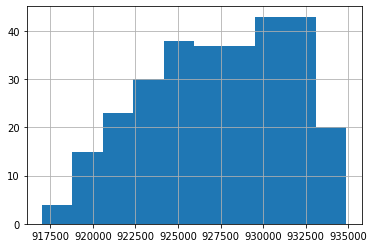

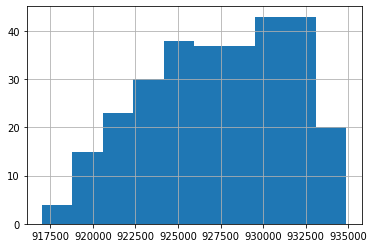

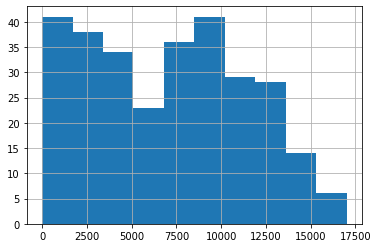

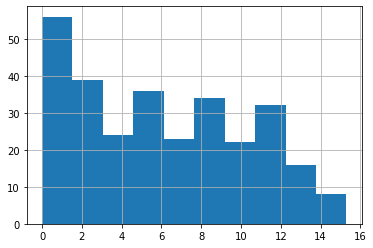

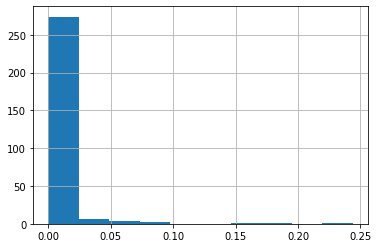

...

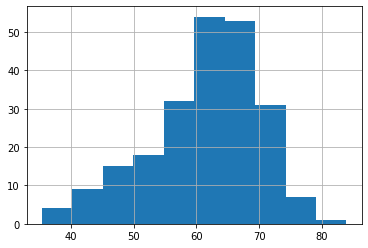

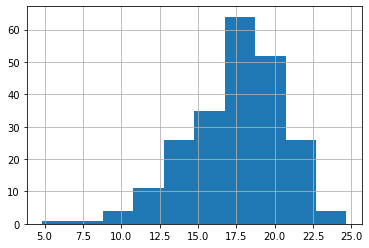

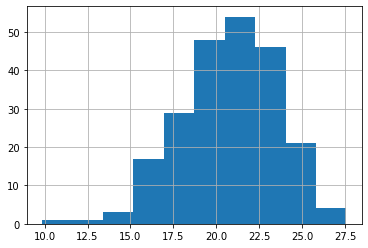

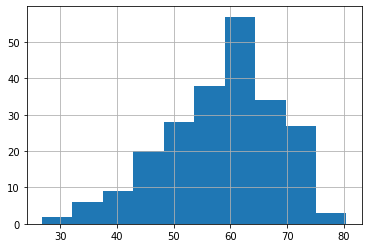

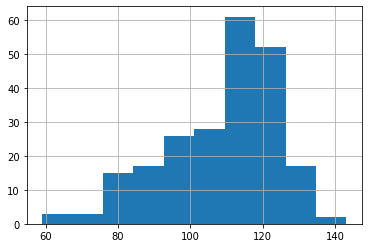

In [34]:
event_id = 0

for year, events in fire_events_all.items():
    for event in events:
        for feature in features:
            plt.figure()
            event[feature].hist()
            plt.savefig(root_dir / feature / f'{year}_{event_id}.png', dpi=300)
            
        event_id += 1